In [1]:
import os
import sys
import json
import numpy as np
import matplotlib.pyplot as plt

sys.path.insert(0, '../codes/')
import bulkMotion
import misc


font_size=26
plt.rcParams.update({'font.size': font_size})

# Read all the paths from the json file

The velocity files, DEM files, and the geoemtry files are all stored on `marmot-nobak`. These paths are stored in `datasets.json`.

We will:

1. Read the paths from the json file into a dictioanry for future use.
2. Make a backup of the json file

In [2]:
## Build a dictionary to save all the LOSgeom class obj from different datasets (tracks)
all_class = dict()


## Read pre-defined paths
my_json = '../inputs/datasets.json'
with open(my_json) as file:
    pathDict = json.load(file)
    
    
## Save pre-defined paths to a back-up
with open('../inputs/{}_bak.json'.format(my_json.split('.')[0]), 'w') as file:
    json_string = json.dumps(pathDict, default=lambda o: o.__dict__, sort_keys=True, indent=2)
    file.write(json_string)

# Plate motion model correction on the dataset

## Dataset: Makran ascending track 086

+ Processing: already with ERA5, SET, ionosphere, demErr corrections applied

+ Make sure to use the plate motion model from papers, replace the `pmm` variable to reflect the plate motion model name

+ Use the corresponding plate name to plot the plate boundary geoemtry and arrows on it



----- 0.00 seconds ----- start timing

Analyze the data from:  Makran a086
prepare LOS geometry in geo-coordinates from file: /marmot-nobak/olstephe/InSAR/Makran/T86a/mintpy/merged_files/geometryGeo_merge.h5
convert azimuth angle to heading angle
convert slantRangeDistance from meter to kilometer
Assume Euler Pole rotation for plate bulk motion
Input: omega_cartesian (wxyz)

Plate: Eurasia

Cartesian rotation vector:
 wx:            -0.0850 mas / yr
 wy:            -0.5310 mas / yr
 wz:            0.7700 mas / yr

Euler pole representation:
 Latitude:      55.0699 deg
 Longitude:     260.9055 deg
 Rotation rate: 0.2609 deg / Ma  

2D array locations

----- 27.49 seconds ----- got the model ENU velocity grid

Using pixel-wise ENU velocity input

----- 0.04 seconds ----- got the model LOS velocity grid



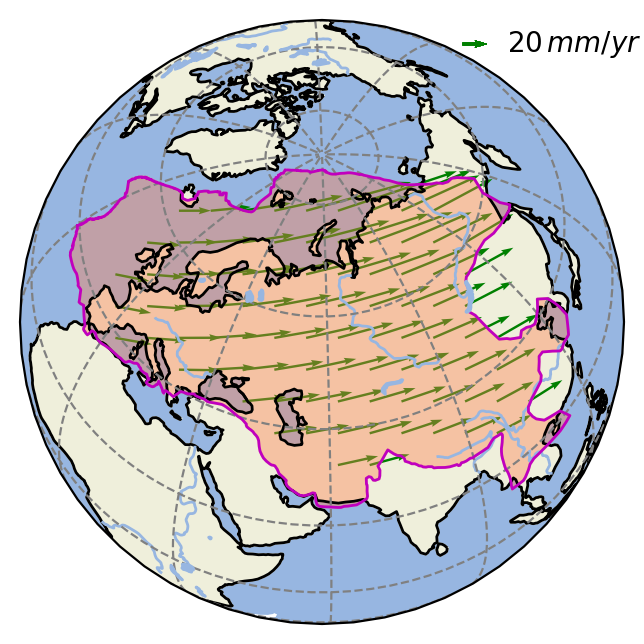

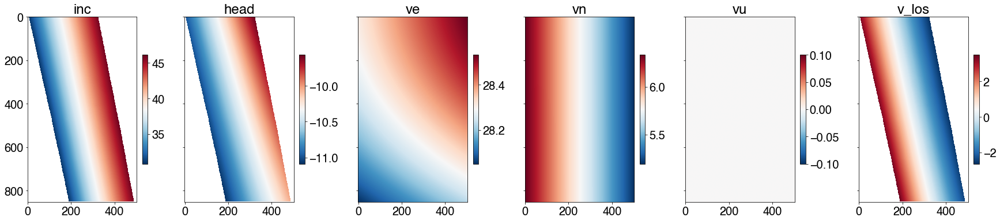

Min. LOS motion = -2.644
Max. LOS motion = 3.485
Dynamic range of LOS motion = 6.129
Use new reference point at lat/lon = 29.8 / 60.6
Reference data: <LOS velocity (iono corr)> 	 shifted by 0.9757485389709473
Set weird modes in NaN: LOS velocity (iono corr)
  Count: 1057 	 value: -0.9757485389709473
  Count: 252 	 value: -7.530972957611084
Reference data: <LOS Plate bulk motion> 	 shifted by -18.8184021973916

----- 2.56 seconds ----- applied correction on referenced data

Range ramp scatter plot shifted by median 0.0
Ground range distance spans 256.8 km
Range ramp scatter plot shifted by median -1.7763568394002505e-15
Ground range distance spans 257.5 km
Range ramp scatter plot shifted by median 0.0
Ground range distance spans 256.8 km
0.125 0.88
0.05416694 0.94756917
Save to file: ../pic/Makran_a086_rampfit.png


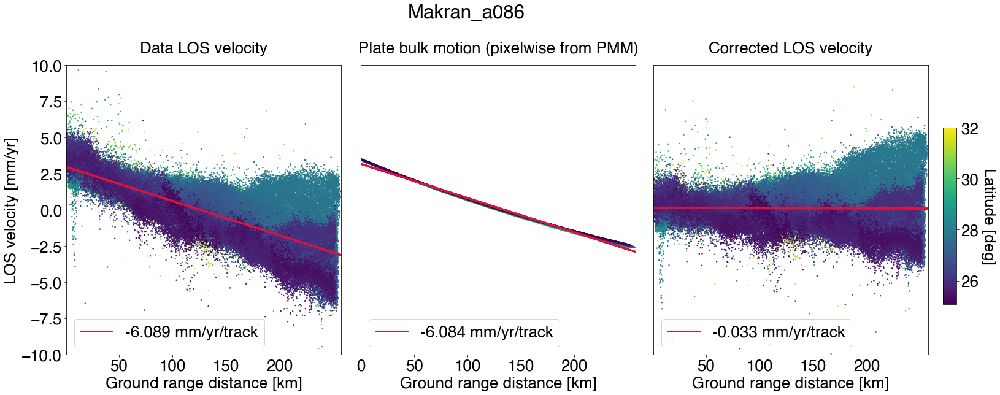


----- 24.23 seconds ----- plotted range ramps

only sohw one common colorbar in the first subplot
view.py reference point~~
Plot data no. 0: <LOS velocity (iono corr)>
view.py /marmot-nobak/olstephe/InSAR/Makran/T86a/mintpy/merged_files/merge_T86a_timeseries_fit_SET_ERA5_Ion_demErr_msk.h5 velocity --fontsize 26 -u mm -v -5 5 --mask no --dem /marmot-nobak/ykliu/makran/a086/dem_resamp_a086/a086.dem --dem-nocontour -c RdBu_r --nocbar --alpha 0.78 --shade-exag 0.05 --shade-min -5000.0 --shade-max 5000.0 --lalo-step 2 --lalo-loc 1 0 0 1 --noscalebar --notitle --noverbose --coastline 10m --ref-lalo 29.8 60.6
Plot data no. 1: <LOS Plate bulk motion>
view.py /marmot-nobak/olstephe/InSAR/Makran/T86a/mintpy/merged_files/merge_T86a_timeseries_fit_SET_ERA5_Ion_demErr_msk.h5 velocity --fontsize 26 -u mm -v -5 5 --mask no --dem /marmot-nobak/ykliu/makran/a086/dem_resamp_a086/a086.dem --dem-nocontour -c RdBu_r --nocbar --alpha 0.78 --shade-exag 0.05 --shade-min -5000.0 --shade-max 5000.0 --lalo-step

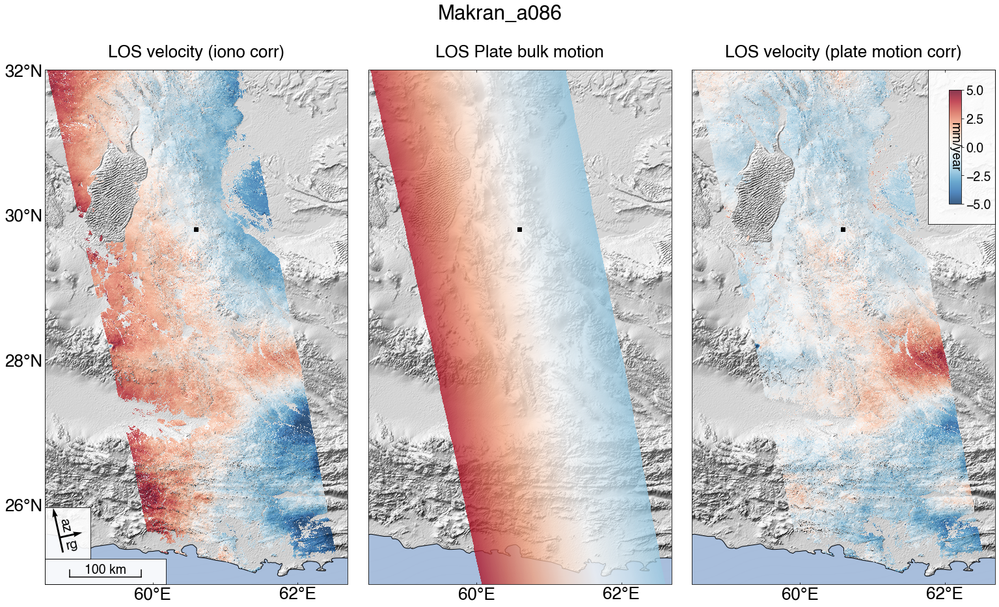


----- 36.95 seconds ----- plotted pmm correction


----- 0.24 seconds ----- saved .h5 files


===== 91.51 seconds ===== total time elapsed



In [3]:
omega_cart = [-0.085, -0.531, 0.770]

dName = 'Makran a086'
pName = 'Eurasia'
pmm   = 'ITRF14'

kwargs = {  'pmm'          : pmm,
            'font_pmm'     : 12,
            'plot_pmm'     : True,
            'plot_ins'     : True,
            'plot_rmp'     : True,
            'plot_ion'     : False,
            'plot_maj'     : True,  
            'vlim_i'       : None,
            'vlim_r'       : [-10,10],
            'vlim_b'       : [-5, 5],
            'refpoint'     : [29.8, 60.6],
            'shadeExg'     : 0.05,
            'saveh5_dir'   : '../out_h5',
            'pic_dir'      : '../pic',
            'suffix'       : '',
            'cmap'         : 'RdBu_r',
            'dpi'          : 300,
            'wspace'       : 0.06,
            'laloStep'     : 2,
            'title_pad'    : 20
             }

all_class[dName] = bulkMotion.evaluate_bulkMotion(pathDict, dName, v_const=None, omega_cart=omega_cart, omega_sph=None, platename=pName, plateBound='MRVL', **kwargs)


----- 0.00 seconds ----- start timing

Analyze the data from:  Makran a013
prepare LOS geometry in geo-coordinates from file: /marmot-nobak/olstephe/InSAR/Makran/T13a/mintpy/merged_files/sub_geometryGeo_merge.h5
convert azimuth angle to heading angle
convert slantRangeDistance from meter to kilometer
Assume Euler Pole rotation for plate bulk motion
Input: omega_cartesian (wxyz)

Plate: Eurasia

Cartesian rotation vector:
 wx:            -0.0850 mas / yr
 wy:            -0.5310 mas / yr
 wz:            0.7700 mas / yr

Euler pole representation:
 Latitude:      55.0699 deg
 Longitude:     260.9055 deg
 Rotation rate: 0.2609 deg / Ma  

2D array locations

----- 25.51 seconds ----- got the model ENU velocity grid

Using pixel-wise ENU velocity input

----- 0.02 seconds ----- got the model LOS velocity grid



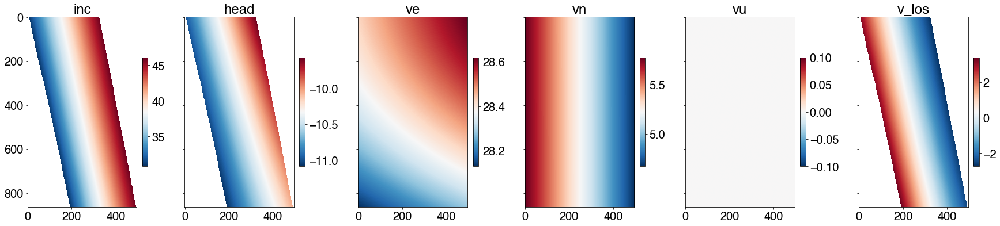

Min. LOS motion = -2.753
Max. LOS motion = 3.405
Dynamic range of LOS motion = 6.157
Use new reference point at lat/lon = 29.0 / 62.5
Reference data: <LOS velocity (iono corr)> 	 shifted by 1.0762560367584229
Set weird modes in NaN: LOS velocity (iono corr)
  Count: 1854 	 value: 0.6050760746002197
  Count: 189 	 value: 1.5298635959625244
Reference data: <LOS Plate bulk motion> 	 shifted by -18.086907566051515

----- 2.39 seconds ----- applied correction on referenced data

Range ramp scatter plot shifted by median 0.0
Ground range distance spans 256.1 km
Range ramp scatter plot shifted by median 0.0
Ground range distance spans 256.4 km
Range ramp scatter plot shifted by median 0.0
Ground range distance spans 256.1 km
0.125 0.88
0.05416694 0.94756917
Save to file: ../pic/Makran_a013_rampfit.png


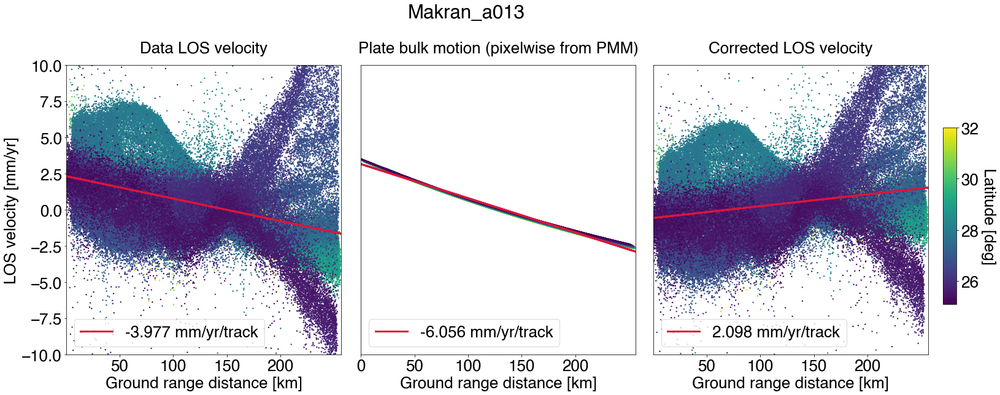


----- 21.99 seconds ----- plotted range ramps

only sohw one common colorbar in the first subplot
view.py reference point~~
Plot data no. 0: <LOS velocity (iono corr)>
view.py /marmot-nobak/olstephe/InSAR/Makran/T13a/mintpy/merged_files/merge_T13a_timeseries_fit_SET_ERA5_Ion_demErr_msk.h5 velocity --fontsize 26 -u mm -v -5 5 --mask no --dem /marmot-nobak/ykliu/makran/a013/dem_resamp_a013/a013.dem --dem-nocontour -c RdBu_r --nocbar --alpha 0.78 --shade-exag 0.05 --shade-min -5000.0 --shade-max 5000.0 --lalo-step 2 --lalo-loc 1 0 0 1 --noscalebar --notitle --noverbose --coastline 10m --ref-lalo 29.0 62.5
Plot data no. 1: <LOS Plate bulk motion>
view.py /marmot-nobak/olstephe/InSAR/Makran/T13a/mintpy/merged_files/merge_T13a_timeseries_fit_SET_ERA5_Ion_demErr_msk.h5 velocity --fontsize 26 -u mm -v -5 5 --mask no --dem /marmot-nobak/ykliu/makran/a013/dem_resamp_a013/a013.dem --dem-nocontour -c RdBu_r --nocbar --alpha 0.78 --shade-exag 0.05 --shade-min -5000.0 --shade-max 5000.0 --lalo-step

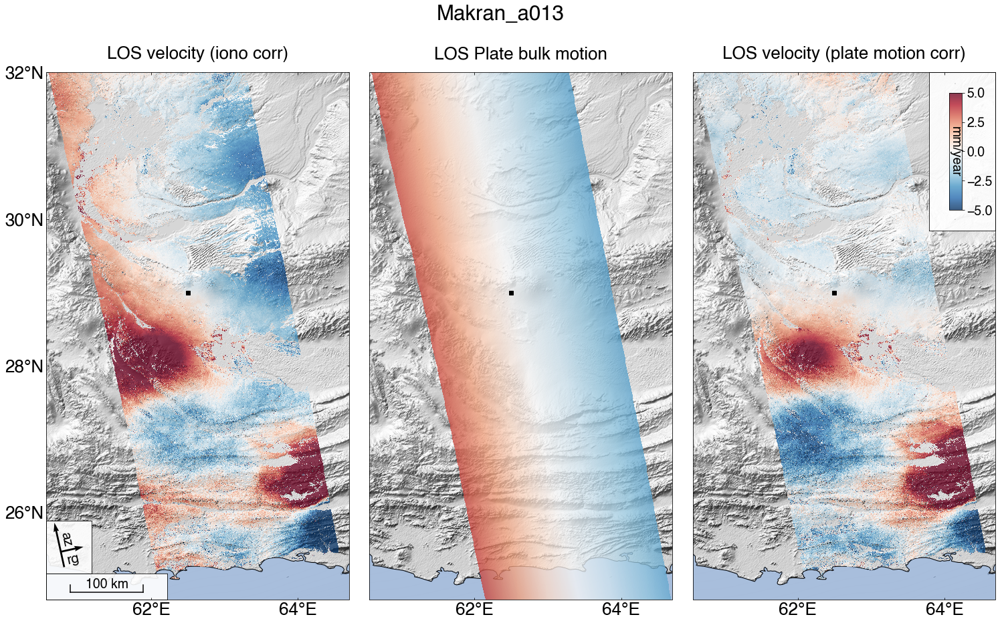


----- 34.45 seconds ----- plotted pmm correction


----- 0.19 seconds ----- saved .h5 files


===== 84.55 seconds ===== total time elapsed



In [4]:
omega_cart = [-0.085, -0.531, 0.770]

dName = 'Makran a013'
pName = 'Eurasia'
pmm   = 'ITRF14'

kwargs = {  'pmm'          : pmm,
            'font_pmm'     : 12,
            'plot_pmm'     : False,
            'plot_ins'     : True,
            'plot_rmp'     : True,
            'plot_ion'     : False,
            'plot_maj'     : True,  
            'vlim_i'       : None,
            'vlim_r'       : [-10,10],
            'vlim_b'       : [-5, 5],
            'refpoint'     : [29., 62.5],
            'shadeExg'     : 0.05,
            'saveh5_dir'   : '../out_h5',
            'pic_dir'      : '../pic',
            'suffix'       : '',
            'cmap'         : 'RdBu_r',
            'dpi'          : 300,
            'wspace'       : 0.06,
            'laloStep'     : 2,
            'title_pad'    : 20
             }

all_class[dName] = bulkMotion.evaluate_bulkMotion(pathDict, dName, v_const=None, omega_cart=omega_cart, omega_sph=None, platename=pName, plateBound='MRVL', **kwargs)


----- 0.00 seconds ----- start timing

Analyze the data from:  Makran a115
prepare LOS geometry in geo-coordinates from file: /marmot-nobak/olstephe/InSAR/Makran/T115a/mintpy/process_stack_all_time_full_eff_repeat_ion/inputs/geo_geometryRadar.h5
convert azimuth angle to heading angle
convert slantRangeDistance from meter to kilometer
Assume Euler Pole rotation for plate bulk motion
Input: omega_cartesian (wxyz)

Plate: Eurasia

Cartesian rotation vector:
 wx:            -0.0850 mas / yr
 wy:            -0.5310 mas / yr
 wz:            0.7700 mas / yr

Euler pole representation:
 Latitude:      55.0699 deg
 Longitude:     260.9055 deg
 Rotation rate: 0.2609 deg / Ma  

2D array locations

----- 25.88 seconds ----- got the model ENU velocity grid

Using pixel-wise ENU velocity input

----- 0.03 seconds ----- got the model LOS velocity grid



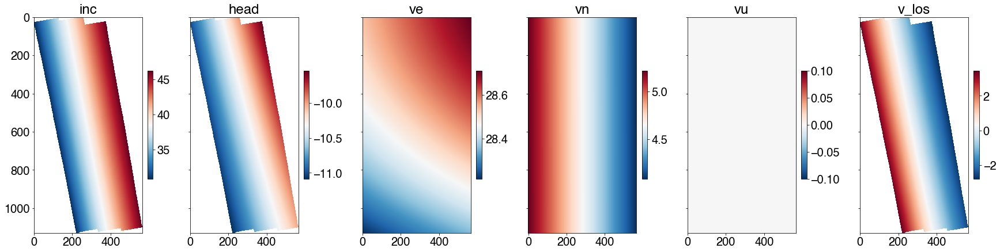

Min. LOS motion = -2.801
Max. LOS motion = 3.434
Dynamic range of LOS motion = 6.235
Use new reference point at lat/lon = 28.7 / 64.8
Reference data: <LOS velocity (iono corr)> 	 shifted by -2.254514694213867
Set weird modes in NaN: LOS velocity (iono corr)
  Count: 3588 	 value: 0.6911568641662598
Reference data: <LOS Plate bulk motion> 	 shifted by -18.4850830473939

----- 2.28 seconds ----- applied correction on referenced data

Range ramp scatter plot shifted by median 0.0
Ground range distance spans 253.6 km
Range ramp scatter plot shifted by median 0.0
Ground range distance spans 255.5 km
Range ramp scatter plot shifted by median 0.0
Ground range distance spans 253.6 km
0.125 0.88
0.05416694 0.94756917
Save to file: ../pic/Makran_a115_rampfit.png


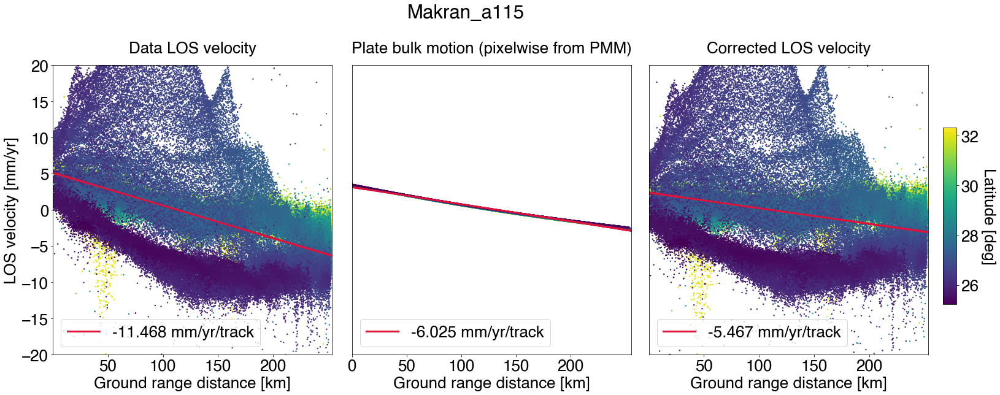


----- 30.23 seconds ----- plotted range ramps

view.py reference point~~
Plot data no. 0: <LOS velocity (iono corr)>
view.py /marmot-nobak/olstephe/InSAR/Makran/T115a/mintpy/process_stack_all_time_full_eff_repeat_ion/timeseries_fits/geo_timeseries_fit_SET_ERA5_Ion_demErr_msk.h5 velocity --fontsize 26 -u mm -v -15 15 --mask no --dem /marmot-nobak/ykliu/makran/a115/dem_resamp_a115/a115.dem --dem-nocontour -c RdBu_r --nocbar --alpha 0.78 --shade-exag 0.05 --shade-min -5000.0 --shade-max 5000.0 --lalo-step 2 --lalo-loc 1 0 0 1 --noscalebar --notitle --noverbose --coastline 10m --ref-lalo 28.7 64.8
Plot data no. 1: <LOS Plate bulk motion>
view.py /marmot-nobak/olstephe/InSAR/Makran/T115a/mintpy/process_stack_all_time_full_eff_repeat_ion/timeseries_fits/geo_timeseries_fit_SET_ERA5_Ion_demErr_msk.h5 velocity --fontsize 26 -u mm -v -5 5 --mask no --dem /marmot-nobak/ykliu/makran/a115/dem_resamp_a115/a115.dem --dem-nocontour -c RdBu_r --nocbar --alpha 0.78 --shade-exag 0.05 --shade-min -5000.0

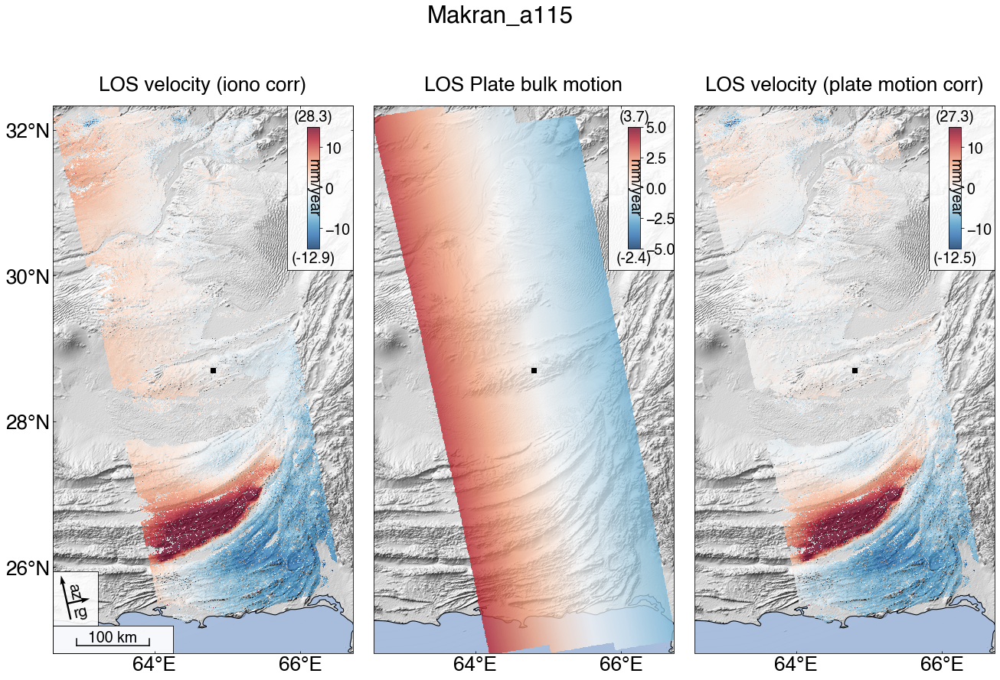


----- 30.50 seconds ----- plotted pmm correction


----- 0.23 seconds ----- saved .h5 files


===== 89.16 seconds ===== total time elapsed



In [5]:
omega_cart = [-0.085, -0.531, 0.770]

dName = 'Makran a115'
pName = 'Eurasia'
pmm   = 'ITRF14'

kwargs = {  'pmm'          : pmm,
            'font_pmm'     : 12,
            'plot_pmm'     : False,
            'plot_ins'     : True,
            'plot_rmp'     : True,
            'plot_ion'     : False,
            'plot_maj'     : True,  
            'vlim_i'       : None,
            'vlim_r'       : [-20,20],
            'vlim_b'       : [[-15,15],[-5,5],[-15,15]],
            'refpoint'     : [28.7, 64.8],
            'shadeExg'     : 0.05,
            'saveh5_dir'   : '../out_h5',
            'pic_dir'      : '../pic',
            'suffix'       : '',
            'cmap'         : 'RdBu_r',
            'dpi'          : 300,
            'wspace'       : 0.06,
            'laloStep'     : 2,
            'title_pad'    : 20
             }

all_class[dName] = bulkMotion.evaluate_bulkMotion(pathDict, dName, v_const=None, omega_cart=omega_cart, omega_sph=None, platename=pName, plateBound='MRVL', **kwargs)


----- 0.00 seconds ----- start timing

Analyze the data from:  Makran a159
prepare LOS geometry in geo-coordinates from file: /marmot-nobak/olstephe/InSAR/Makran/T159a/mintpy/merged_files/sub_geometryGeo_merge.h5
convert azimuth angle to heading angle
convert slantRangeDistance from meter to kilometer
Assume Euler Pole rotation for plate bulk motion
Input: omega_cartesian (wxyz)

Plate: Eurasia

Cartesian rotation vector:
 wx:            -0.0850 mas / yr
 wy:            -0.5310 mas / yr
 wz:            0.7700 mas / yr

Euler pole representation:
 Latitude:      55.0699 deg
 Longitude:     260.9055 deg
 Rotation rate: 0.2609 deg / Ma  

2D array locations

----- 23.73 seconds ----- got the model ENU velocity grid

Using pixel-wise ENU velocity input

----- 0.02 seconds ----- got the model LOS velocity grid



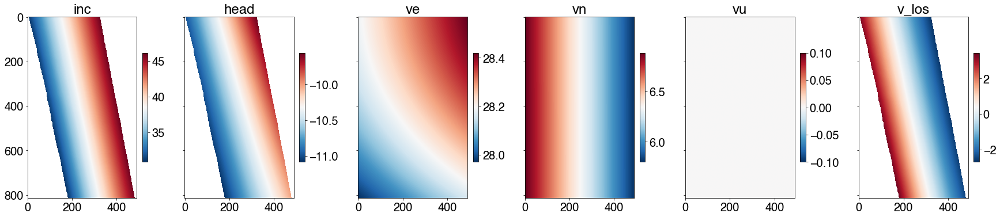

Min. LOS motion = -2.709
Max. LOS motion = 3.451
Dynamic range of LOS motion = 6.160
Use new reference point at lat/lon = 28.4 / 58.75
Reference data: <LOS velocity (iono corr)> 	 shifted by -0.140844464302063
Set weird modes in NaN: LOS velocity (iono corr)
  Count: 1544 	 value: 0.140844464302063
  Count: 476 	 value: -0.261211097240448
Reference data: <LOS Plate bulk motion> 	 shifted by -18.61742485093032

----- 2.12 seconds ----- applied correction on referenced data

Range ramp scatter plot shifted by median 0.0
Ground range distance spans 256.7 km
Range ramp scatter plot shifted by median 0.0
Ground range distance spans 257.9 km
Range ramp scatter plot shifted by median 0.0
Ground range distance spans 256.7 km
0.125 0.88
0.05416694 0.94756917
Save to file: ../pic/Makran_a159_rampfit.png


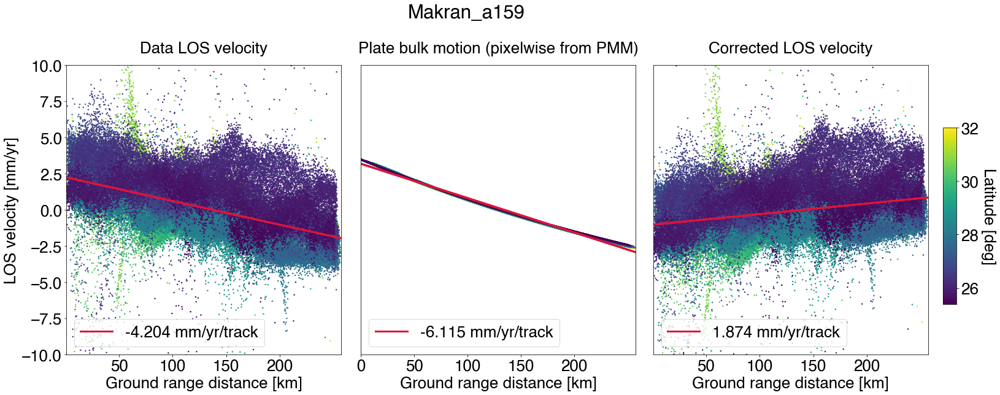


----- 21.80 seconds ----- plotted range ramps

only sohw one common colorbar in the first subplot
view.py reference point~~
Plot data no. 0: <LOS velocity (iono corr)>
view.py /marmot-nobak/olstephe/InSAR/Makran/T159a/mintpy/merged_files/merge_T159a_timeseries_fit_SET_ERA5_Ion_demErr_msk.h5 velocity --fontsize 26 -u mm -v -5 5 --mask no --dem /marmot-nobak/ykliu/makran/a159/dem_resamp_a159/a159.dem --dem-nocontour -c RdBu_r --nocbar --alpha 0.78 --shade-exag 0.05 --shade-min -5000.0 --shade-max 5000.0 --lalo-step 2 --lalo-loc 1 0 0 1 --noscalebar --notitle --noverbose --coastline 10m --ref-lalo 28.4 58.75
Plot data no. 1: <LOS Plate bulk motion>
view.py /marmot-nobak/olstephe/InSAR/Makran/T159a/mintpy/merged_files/merge_T159a_timeseries_fit_SET_ERA5_Ion_demErr_msk.h5 velocity --fontsize 26 -u mm -v -5 5 --mask no --dem /marmot-nobak/ykliu/makran/a159/dem_resamp_a159/a159.dem --dem-nocontour -c RdBu_r --nocbar --alpha 0.78 --shade-exag 0.05 --shade-min -5000.0 --shade-max 5000.0 --lalo

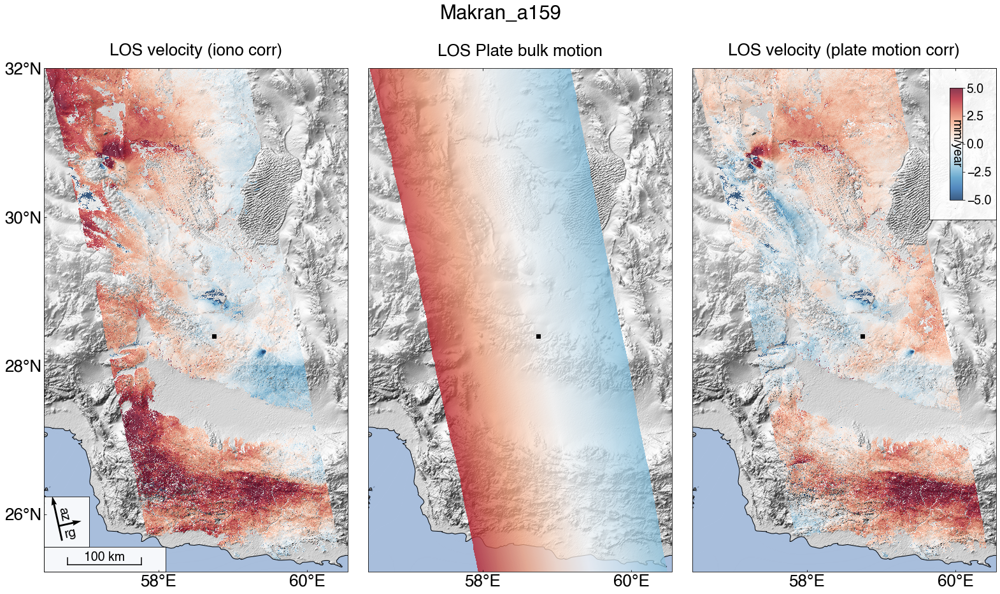


----- 34.19 seconds ----- plotted pmm correction


----- 0.17 seconds ----- saved .h5 files


===== 82.03 seconds ===== total time elapsed



In [6]:
omega_cart = [-0.085, -0.531, 0.770]

dName = 'Makran a159'
pName = 'Eurasia'
pmm   = 'ITRF14'

kwargs = {  'pmm'          : pmm,
            'font_pmm'     : 12,
            'plot_pmm'     : False,
            'plot_ins'     : True,
            'plot_rmp'     : True,
            'plot_ion'     : False,
            'plot_maj'     : True,  
            'vlim_i'       : None,
            'vlim_r'       : [-10,10],
            'vlim_b'       : [-5,5],
            'refpoint'     : [28.4, 58.75],
            'shadeExg'     : 0.05,
            'saveh5_dir'   : '../out_h5',
            'pic_dir'      : '../pic',
            'suffix'       : '',
            'cmap'         : 'RdBu_r',
            'dpi'          : 300,
            'wspace'       : 0.06,
            'laloStep'     : 2,
            'title_pad'    : 20
             }

all_class[dName] = bulkMotion.evaluate_bulkMotion(pathDict, dName, v_const=None, omega_cart=omega_cart, omega_sph=None, platename=pName, plateBound='MRVL', **kwargs)


----- 0.00 seconds ----- start timing

Analyze the data from:  Makran d020
prepare LOS geometry in geo-coordinates from file: /marmot-nobak/olstephe/InSAR/Makran/T20d/mintpy/merged_files/sub_geometryGeo_merge.h5
convert azimuth angle to heading angle
convert slantRangeDistance from meter to kilometer
Assume Euler Pole rotation for plate bulk motion
Input: omega_cartesian (wxyz)

Plate: Eurasia

Cartesian rotation vector:
 wx:            -0.0850 mas / yr
 wy:            -0.5310 mas / yr
 wz:            0.7700 mas / yr

Euler pole representation:
 Latitude:      55.0699 deg
 Longitude:     260.9055 deg
 Rotation rate: 0.2609 deg / Ma  

2D array locations

----- 23.30 seconds ----- got the model ENU velocity grid

Using pixel-wise ENU velocity input

----- 0.03 seconds ----- got the model LOS velocity grid



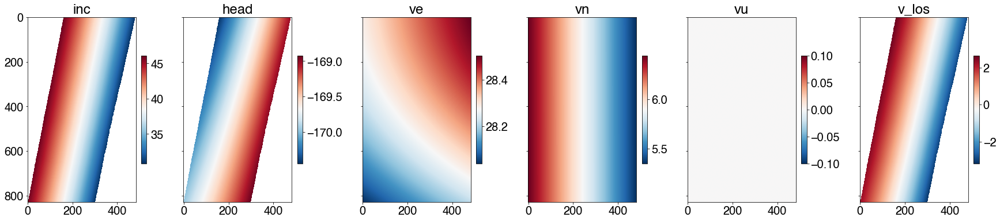

Min. LOS motion = -3.171
Max. LOS motion = 2.655
Dynamic range of LOS motion = 5.826
Use new reference point at lat/lon = 28.75 / 60.0
Reference data: <LOS velocity (iono corr)> 	 shifted by 0.5581938624382019
Set weird modes in NaN: LOS velocity (iono corr)
  Count: 2502 	 value: 0.11479824781417847
  Count: 404 	 value: -0.5581938624382019
Reference data: <LOS Plate bulk motion> 	 shifted by 17.080562382296545

----- 1.98 seconds ----- applied correction on referenced data

Range ramp scatter plot shifted by median 0.0
Ground range distance spans 256.5 km
Range ramp scatter plot shifted by median 0.0
Ground range distance spans 257.3 km
Range ramp scatter plot shifted by median 0.0
Ground range distance spans 256.5 km
0.125 0.88
0.05416694 0.94756917
Save to file: ../pic/Makran_d020_rampfit.png


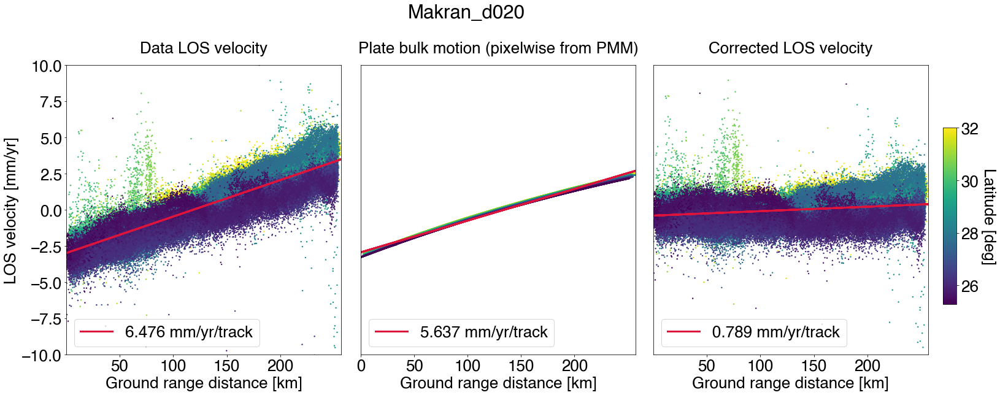


----- 20.66 seconds ----- plotted range ramps

only sohw one common colorbar in the first subplot
view.py reference point~~
Plot data no. 0: <LOS velocity (iono corr)>
view.py /marmot-nobak/olstephe/InSAR/Makran/T20d/mintpy/merged_files/merge_T20d_timeseries_fit_SET_ERA5_Ion_demErr_msk.h5 velocity --fontsize 26 -u mm -v -5 5 --mask no --dem /marmot-nobak/ykliu/makran/d020/dem_resamp_d020/d020.dem --dem-nocontour -c RdBu_r --nocbar --alpha 0.78 --shade-exag 0.05 --shade-min -5000.0 --shade-max 5000.0 --lalo-step 2 --lalo-loc 1 0 0 1 --noscalebar --notitle --noverbose --coastline 10m --ref-lalo 28.75 60.0
Plot data no. 1: <LOS Plate bulk motion>
view.py /marmot-nobak/olstephe/InSAR/Makran/T20d/mintpy/merged_files/merge_T20d_timeseries_fit_SET_ERA5_Ion_demErr_msk.h5 velocity --fontsize 26 -u mm -v -5 5 --mask no --dem /marmot-nobak/ykliu/makran/d020/dem_resamp_d020/d020.dem --dem-nocontour -c RdBu_r --nocbar --alpha 0.78 --shade-exag 0.05 --shade-min -5000.0 --shade-max 5000.0 --lalo-ste

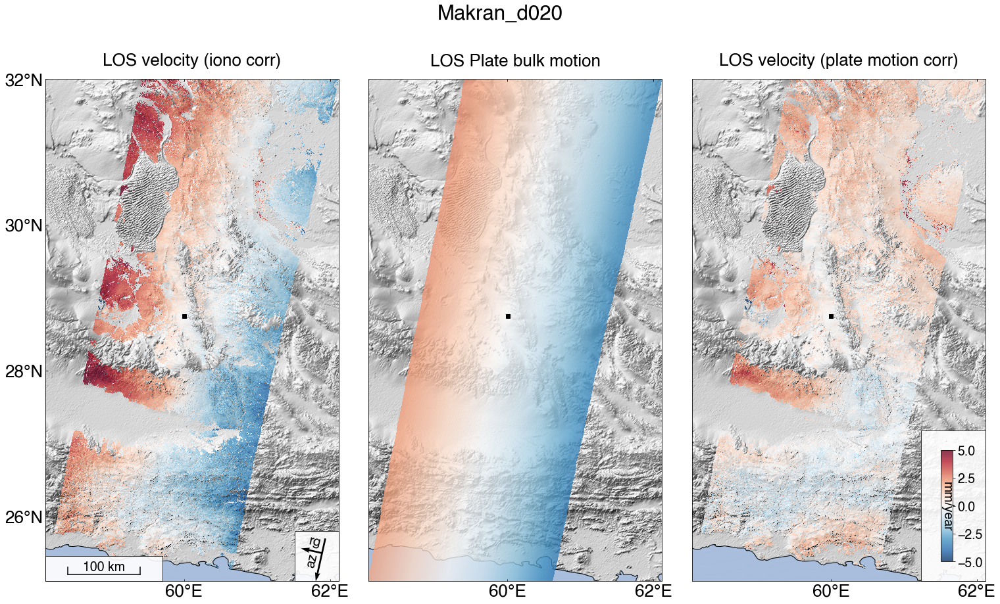


----- 29.91 seconds ----- plotted pmm correction


----- 0.16 seconds ----- saved .h5 files


===== 76.04 seconds ===== total time elapsed



In [7]:
omega_cart = [-0.085, -0.531, 0.770]

dName = 'Makran d020'
pName = 'Eurasia'
pmm   = 'ITRF14'

kwargs = {  'pmm'          : pmm,
            'font_pmm'     : 12,
            'plot_pmm'     : False,
            'plot_ins'     : True,
            'plot_rmp'     : True,
            'plot_ion'     : False,
            'plot_maj'     : True,  
            'vlim_i'       : None,
            'vlim_r'       : [-10,10],
            'vlim_b'       : [-5,5],
            'refpoint'     : [28.75, 60.0],
            'shadeExg'     : 0.05,
            'saveh5_dir'   : '../out_h5',
            'pic_dir'      : '../pic',
            'suffix'       : '',
            'cmap'         : 'RdBu_r',
            'dpi'          : 300,
            'wspace'       : 0.06,
            'laloStep'     : 2,
            'title_pad'    : 20
             }

all_class[dName] = bulkMotion.evaluate_bulkMotion(pathDict, dName, v_const=None, omega_cart=omega_cart, omega_sph=None, platename=pName, plateBound='MRVL', **kwargs)